## Importing libraries

In [4]:
import numpy as np # linear algebra
import pandas as pd
import ast 

from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.figure_factory as ff

import os
import math
import cv2

## Data loading & Per-processing

In [5]:
df= pd.read_csv('../input/global-wheat-detection/train.csv')
print(df.shape)
df.head()

(147793, 5)


,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [6]:
df.bbox=df.bbox.apply(lambda x: ast.literal_eval(x))

In [7]:
uni_imgs=df.image_id.unique()
uni_imgs

array(['b6ab77fd7', 'b53afdf5c', '7b72ea0fb', ..., 'a5c8d5f5c',
       'e6b5e296d', '5e0747034'], dtype=object)

In [8]:
img_box_dict={}
for u_id in tqdm(uni_imgs):
    arr= df[df.image_id== u_id ]['bbox'].values
    img_box_dict[str(u_id)]= [box for box in arr]

  0%|          | 0/3373 [00:00<?, ?it/s]

In [9]:
df2=df.drop_duplicates(['image_id'], ignore_index=True)
df2

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b53afdf5c,1024,1024,"[988.0, 781.0, 36.0, 96.0]",usask_1
2,7b72ea0fb,1024,1024,"[332.0, 662.0, 113.0, 50.0]",usask_1
3,91c9d9c38,1024,1024,"[124.0, 273.0, 59.0, 73.0]",usask_1
4,41c0123cc,1024,1024,"[0.0, 669.0, 73.0, 111.0]",usask_1
...,...,...,...,...,...
3368,990c1777d,1024,1024,"[120.0, 97.0, 92.0, 89.0]",arvalis_2
3369,bce2fdc4d,1024,1024,"[59.0, 0.0, 133.0, 42.0]",arvalis_2
3370,a5c8d5f5c,1024,1024,"[619.0, 194.0, 113.0, 90.0]",arvalis_2
3371,e6b5e296d,1024,1024,"[940.0, 462.0, 84.0, 85.0]",arvalis_2


In [10]:
df2['boxes']= df2.image_id.apply(lambda x: img_box_dict[str(x)])

df2['box_count']= df2.boxes.apply(lambda x: len(x))
df2.head()

,image_id,width,height,bbox,source,boxes,box_count
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1,"[[834.0, 222.0, 56.0, 36.0], [226.0, 548.0, 13...",47
1,b53afdf5c,1024,1024,"[988.0, 781.0, 36.0, 96.0]",usask_1,"[[988.0, 781.0, 36.0, 96.0], [331.0, 863.0, 70...",46
2,7b72ea0fb,1024,1024,"[332.0, 662.0, 113.0, 50.0]",usask_1,"[[332.0, 662.0, 113.0, 50.0], [285.0, 755.0, 3...",41
3,91c9d9c38,1024,1024,"[124.0, 273.0, 59.0, 73.0]",usask_1,"[[124.0, 273.0, 59.0, 73.0], [688.0, 939.0, 61...",33
4,41c0123cc,1024,1024,"[0.0, 669.0, 73.0, 111.0]",usask_1,"[[0.0, 669.0, 73.0, 111.0], [572.0, 757.0, 110...",34


In [11]:
print("Average Number of Bounding Boxes in an image:", np.average(df2['box_count']))

Average Number of Bounding Boxes in an image: 43.8164838422769


In [12]:
def cal_area(boxes):
    area_list=[]
    for box in boxes:
        x,y,w,h= box
        area_list.append(w*h)
    per= np.sum(np.array(area_list))/(1024.0*1024.0)
    return per*100.0

def max_area(boxes):
    area_list=[]
    for box in boxes:
        x,y,w,h= box
        area_list.append(w*h)
    per= max(area_list)/(1024.0*1024.0)
    return per*100.0
    

In [13]:
df2['per_area']= df2.boxes.apply(lambda x: cal_area(x))
df2['max_area']= df2.boxes.apply(lambda x: max_area(x))

In [14]:
df2.head()

,image_id,width,height,bbox,source,boxes,box_count,per_area,max_area
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1,"[[834.0, 222.0, 56.0, 36.0], [226.0, 548.0, 13...",47,36.395550,2.788544
1,b53afdf5c,1024,1024,"[988.0, 781.0, 36.0, 96.0]",usask_1,"[[988.0, 781.0, 36.0, 96.0], [331.0, 863.0, 70...",46,32.459259,2.102852
2,7b72ea0fb,1024,1024,"[332.0, 662.0, 113.0, 50.0]",usask_1,"[[332.0, 662.0, 113.0, 50.0], [285.0, 755.0, 3...",41,29.572105,2.300262
3,91c9d9c38,1024,1024,"[124.0, 273.0, 59.0, 73.0]",usask_1,"[[124.0, 273.0, 59.0, 73.0], [688.0, 939.0, 61...",33,20.505047,2.112770
4,41c0123cc,1024,1024,"[0.0, 669.0, 73.0, 111.0]",usask_1,"[[0.0, 669.0, 73.0, 111.0], [572.0, 757.0, 110...",34,38.740921,13.862610


In [15]:
def load(path, resize=False, gray=False):
    img= cv2.imread(path)
    if resize:
        img= cv2.resize(img, (500,500))
    if gray:
        img= cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

def draw_rec(img, boxes):
    for box in boxes:
        x,y,w,h= box
        x=int(x); y=int(y); w=int(w); h= int(h)
        img= cv2.rectangle(img, (x,y), (x+w, y+h), color=(255, 153, 0), thickness=3)
    return img

In [16]:
def bright(label):
    path= '../input/global-wheat-detection/train'
    path= path+'/' +label+'.jpg'
    img= load(path, gray=True, resize=True)
    img= img/255.0
    return np.sum(img)/(500.0*500.0)*100

In [17]:
df2['brightness']= df2.image_id.apply(lambda x: bright(x))
df2.head()

,image_id,width,height,bbox,source,boxes,box_count,per_area,max_area,brightness
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1,"[[834.0, 222.0, 56.0, 36.0], [226.0, 548.0, 13...",47,36.395550,2.788544,28.905823
1,b53afdf5c,1024,1024,"[988.0, 781.0, 36.0, 96.0]",usask_1,"[[988.0, 781.0, 36.0, 96.0], [331.0, 863.0, 70...",46,32.459259,2.102852,32.344990
2,7b72ea0fb,1024,1024,"[332.0, 662.0, 113.0, 50.0]",usask_1,"[[332.0, 662.0, 113.0, 50.0], [285.0, 755.0, 3...",41,29.572105,2.300262,26.889556
3,91c9d9c38,1024,1024,"[124.0, 273.0, 59.0, 73.0]",usask_1,"[[124.0, 273.0, 59.0, 73.0], [688.0, 939.0, 61...",33,20.505047,2.112770,28.044238
4,41c0123cc,1024,1024,"[0.0, 669.0, 73.0, 111.0]",usask_1,"[[0.0, 669.0, 73.0, 111.0], [572.0, 757.0, 110...",34,38.740921,13.862610,27.353562


In [18]:
df2.drop(['bbox'], 1, inplace=True)
df2.head()

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  """Entry point for launching an IPython kernel.


,image_id,width,height,source,boxes,box_count,per_area,max_area,brightness
0,b6ab77fd7,1024,1024,usask_1,"[[834.0, 222.0, 56.0, 36.0], [226.0, 548.0, 13...",47,36.395550,2.788544,28.905823
1,b53afdf5c,1024,1024,usask_1,"[[988.0, 781.0, 36.0, 96.0], [331.0, 863.0, 70...",46,32.459259,2.102852,32.344990
2,7b72ea0fb,1024,1024,usask_1,"[[332.0, 662.0, 113.0, 50.0], [285.0, 755.0, 3...",41,29.572105,2.300262,26.889556
3,91c9d9c38,1024,1024,usask_1,"[[124.0, 273.0, 59.0, 73.0], [688.0, 939.0, 61...",33,20.505047,2.112770,28.044238
4,41c0123cc,1024,1024,usask_1,"[[0.0, 669.0, 73.0, 111.0], [572.0, 757.0, 110...",34,38.740921,13.862610,27.353562


## Distribution Analysis

In [19]:
# Use `hole` to create a donut-like pie chart
labels= df2.source.value_counts().index
values= df2.source.value_counts().values
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.3)])
fig.update_layout(
    title_text="Source Distribution",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Source', x=0.50, y=0.5, font_size=20, showarrow=False)])
    
fig.show()

#### TOP data Contributers (Sources)
* arvalis_1
* ethz_1
* arvalis
* rres_1

In [20]:
def hist_channel(df2):
    red, blue, green= [],[],[]
    for img_id in tqdm(df2.image_id.values):
        path= '../input/global-wheat-detection/train'
        img_path= os.path.join(path, img_id)
        img_path= img_path + '.jpg'
        img= load(img_path)
        red.append(np.mean(img[:,:,0]))
        blue.append(np.mean(img[:,:,2]))
        green.append(np.mean(img[:,:,1]))
    return red, green, blue

red, green, blur= hist_channel(df2)

  0%|          | 0/3373 [00:00<?, ?it/s]

In [21]:
# Group data together
hist_data = [red, green, blur]

group_labels = ['red', 'green', 'blue']
colors = ['rgb(255, 51, 51)', 'rgb(0, 153, 0)', 'rgb(77, 148, 255)']

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=.4, colors=colors)
fig.update_layout(
    title_text="RGB color Distribution",
    xaxis=dict(title='Pixel Value'))
fig.show()

In [22]:
# Add histogram data
group_labels=[]
hist_data = []
for label in df2.source.unique():
    group_labels.append(label)
    # Group data together
    hist_data.append(df2[df2.source== label].brightness.values )



# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels)

fig.update_layout(
    title_text="Brightness Distribution grouped with source",
    xaxis=dict(title='Brightness Percentage'))
fig.show()

#### Bright image contributers
* arvalis_1
* arvalis_2

#### Non-Bright image contributers
* rres_1
* inrae_1

In [23]:
# Add histogram data
group_labels=[]
hist_data = []
for label in df2.source.unique():
    group_labels.append(label)
    # Group data together
    hist_data.append(df2[df2.source== label].per_area.values )



# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels)

fig.update_layout(
    title_text="Bounding box Area per image Distribution",
    xaxis=dict(title='Percent Area'))
fig.show()

In [24]:
hist_data = [df2.box_count.values]
group_labels = ['Boxes'] # name of the dataset

fig = ff.create_distplot(hist_data, group_labels)
fig.update_layout(
    title_text="Bounding box Count per image Distribution",
    xaxis=dict(title='Count'))
fig.show()

## Viewing random images

  0%|          | 0/15 [00:00<?, ?it/s]

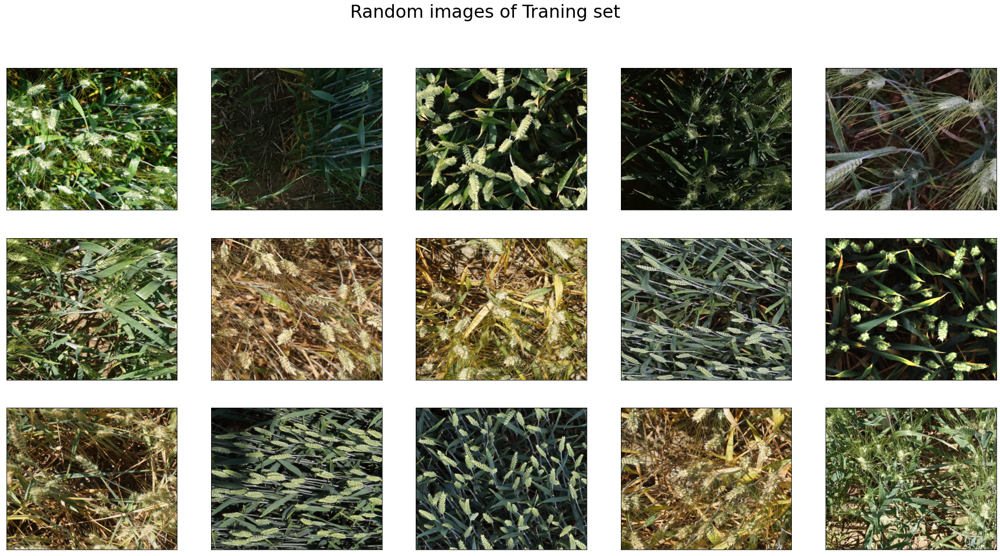

In [25]:
sample= df2.sample(15).image_id.values
path= '../input/global-wheat-detection/train'
f, ax= plt.subplots(3, 5, figsize=(30, 15))
i=0
for label in tqdm(sample):
    img_path= os.path.join(path, label)
    img_path= img_path + '.jpg'
    
    img= load(img_path)
    ax[i//5][i%5].imshow(img, aspect='auto')
    ax[i//5][i%5].set_xticks([]); ax[i//5][i%5].set_yticks([])
    i+=1
plt.suptitle("Random images of Traning set", size=30)
plt.show()

## Images with Bounding Boxes

  0%|          | 0/15 [00:00<?, ?it/s]

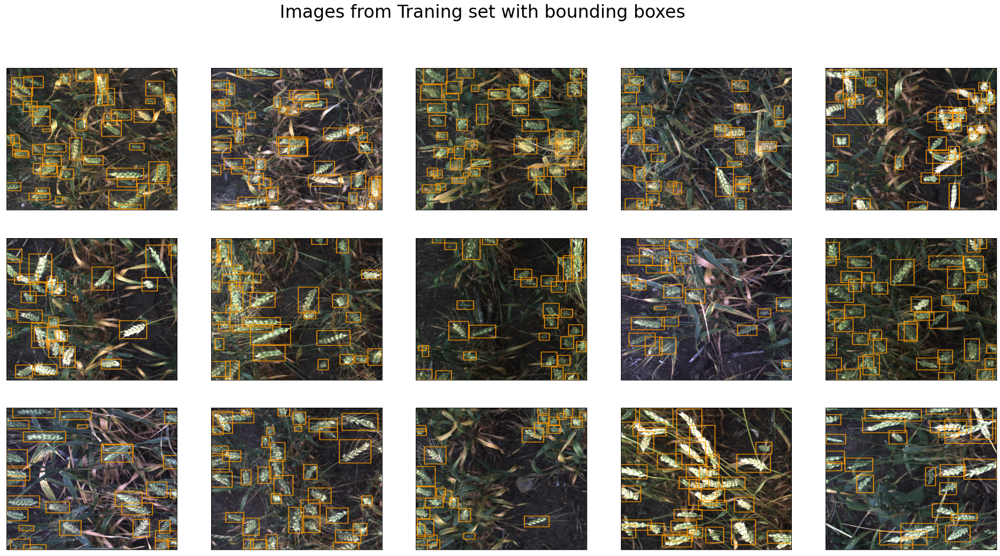

In [26]:
sample= df2.image_id[:15].values
path= '../input/global-wheat-detection/train'
f, ax= plt.subplots(3, 5, figsize=(30, 15))
i=0
for label in tqdm(sample):
    img_path= os.path.join(path, label)
    img_path= img_path + '.jpg'
    
    img= load(img_path)
    img= draw_rec(img, df2.boxes[i])
    ax[i//5][i%5].imshow(img, aspect='auto')
    ax[i//5][i%5].set_xticks([]); ax[i//5][i%5].set_yticks([])
    i+=1
plt.suptitle("Images from Traning set with bounding boxes ", size=30)
plt.show()

## Images with HIGH density bounding boxes

  0%|          | 0/6 [00:00<?, ?it/s]

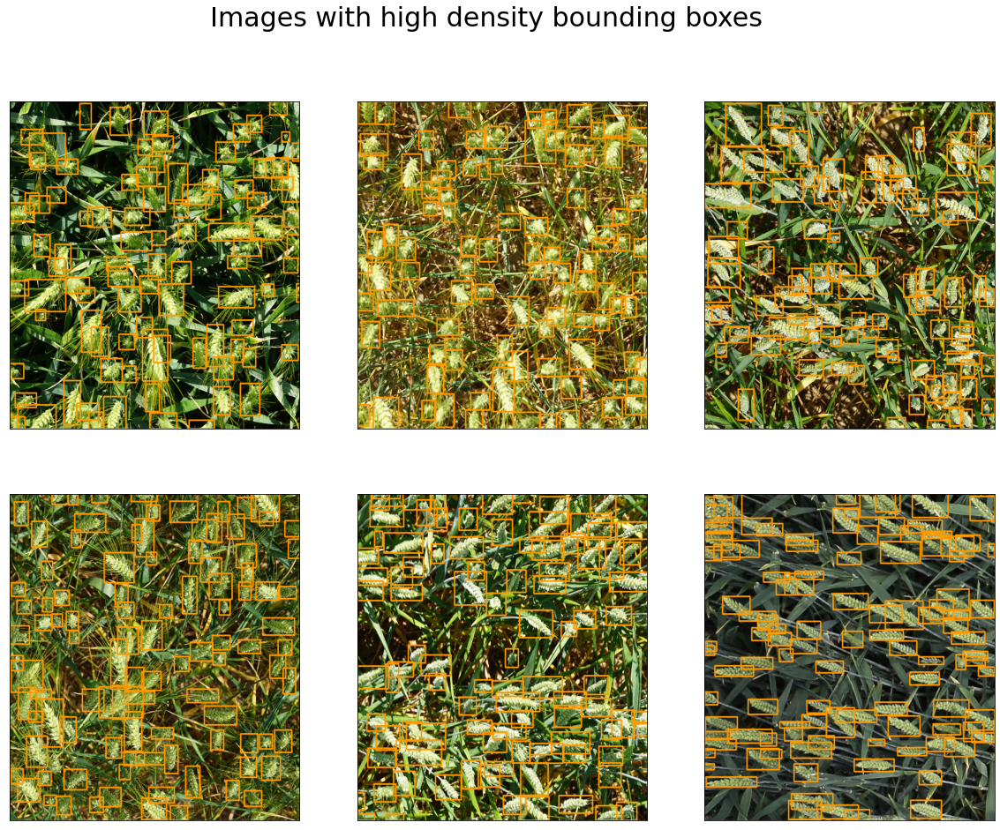

In [27]:
sample= df2[df2.box_count>90].image_id[:6].values
label= df2[df2.box_count>90].index
path= '../input/global-wheat-detection/train'
f, ax= plt.subplots(2, 3, figsize=(20, 15))
i=0
for label in tqdm(sample):
    img_path= os.path.join(path, label)
    img_path= img_path + '.jpg'
    
    img= load(img_path)
    img= draw_rec(img, df2[df2.box_count>90].reset_index().boxes[i])
    ax[i//3][i%3].imshow(img, aspect='auto')
    ax[i//3][i%3].set_xticks([]); ax[i//3][i%3].set_yticks([])
    i+=1
plt.suptitle("Images with high density bounding boxes", size=30)
plt.show()
    

## Images with LOW density bounding boxes

  0%|          | 0/6 [00:00<?, ?it/s]

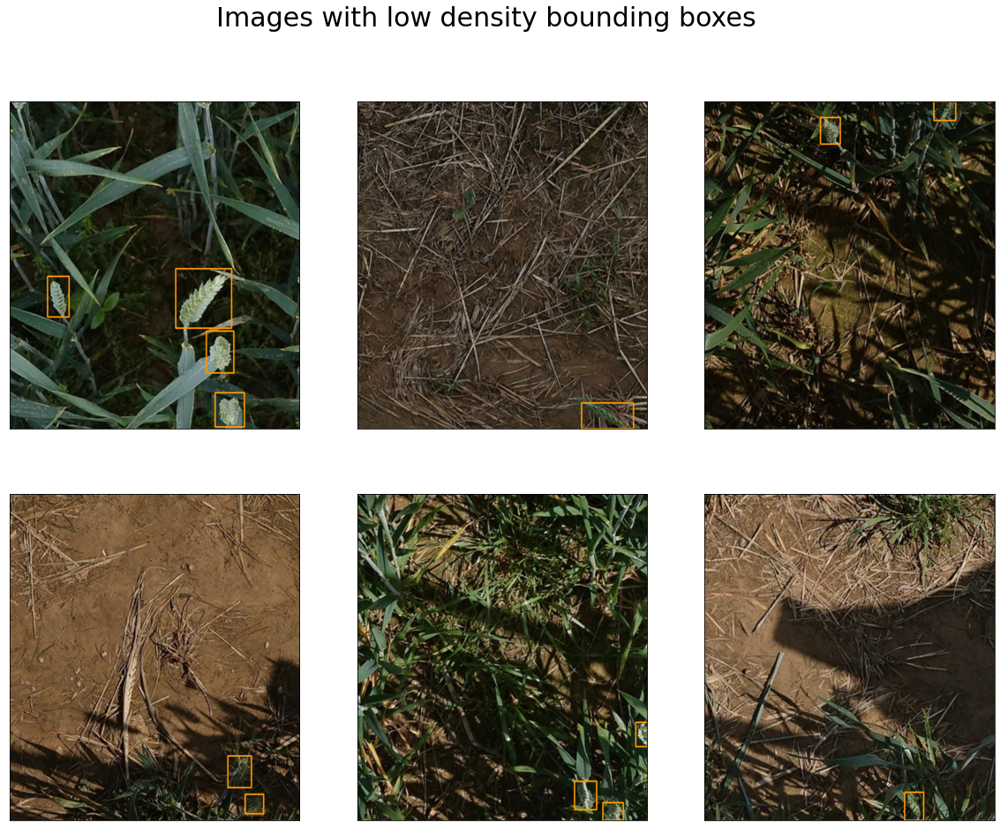

In [28]:
sample= df2[df2.box_count< 5].image_id[:6].values

path= '../input/global-wheat-detection/train'
f, ax= plt.subplots(2, 3, figsize=(20, 15))
i=0
for label in tqdm(sample):
    img_path= os.path.join(path, label)
    img_path= img_path + '.jpg'
    
    img= load(img_path)
    img= draw_rec(img, df2[df2.box_count< 5].reset_index().boxes[i])
    ax[i//3][i%3].imshow(img, aspect='auto')
    ax[i//3][i%3].set_xticks([]); ax[i//3][i%3].set_yticks([])
    i+=1
    
plt.suptitle("Images with low density bounding boxes", size=30)
plt.show()

## Images with HIGH AREA Bounding boxes

  0%|          | 0/6 [00:00<?, ?it/s]

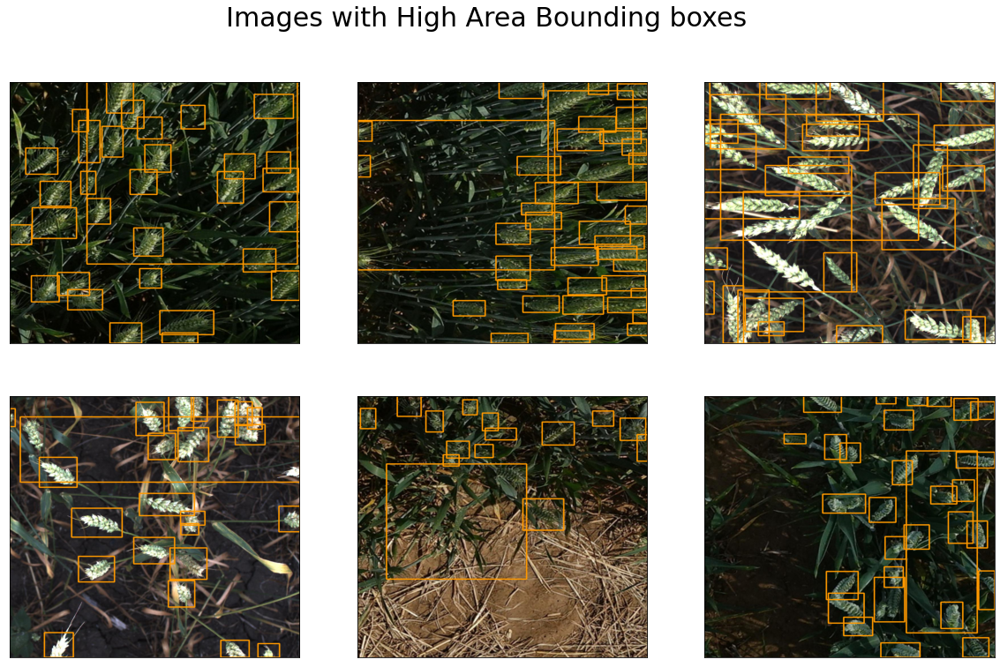

In [29]:
sample= df2.sort_values(by=['max_area'], ascending=False)[:6].reset_index().image_id.values

path= '../input/global-wheat-detection/train'
f, ax= plt.subplots(2, 3, figsize=(20, 12))
i=0
for label in tqdm(sample):
    img_path= os.path.join(path, label)
    img_path= img_path + '.jpg'
    
    img= load(img_path)
    img= draw_rec(img, df2.sort_values(by=['max_area'], ascending=False)[0:10].reset_index().boxes[i])
    ax[i//3][i%3].imshow(img, aspect='auto')
    ax[i//3][i%3].set_xticks([]); ax[i//3][i%3].set_yticks([])
    i+=1
plt.suptitle("Images with High Area Bounding boxes", size=30)
plt.show()

#### The problem with *High Area Mismatched Bounding Boxes* needs to be addressed to Model Traning

## Images with LOW AREA Bounding boxes

  0%|          | 0/6 [00:00<?, ?it/s]

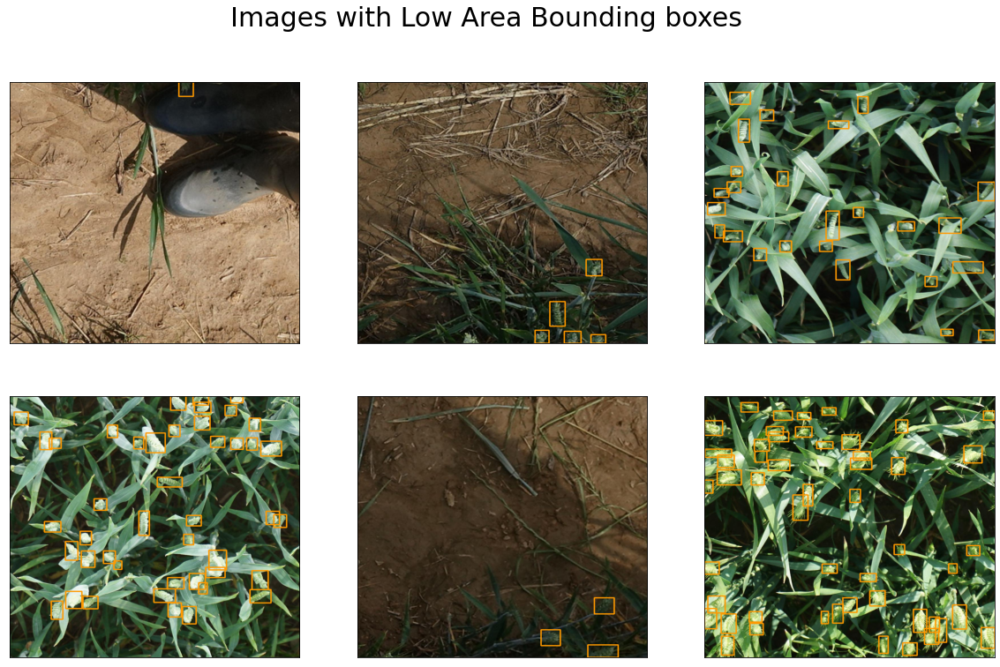

In [30]:
sample= df2.sort_values(by=['max_area'], ascending=True)[:6].reset_index().image_id.values

path= '../input/global-wheat-detection/train'
f, ax= plt.subplots(2, 3, figsize=(20, 12))
i=0
for label in tqdm(sample):
    img_path= os.path.join(path, label)
    img_path= img_path + '.jpg'
    
    img= load(img_path)
    img= draw_rec(img, df2.sort_values(by=['max_area'], ascending=True)[:10].reset_index().boxes[i])
    ax[i//3][i%3].imshow(img, aspect='auto')
    ax[i//3][i%3].set_xticks([]); ax[i//3][i%3].set_yticks([])
    i+=1
plt.suptitle("Images with Low Area Bounding boxes", size=30)
plt.show()

## Bright images

  0%|          | 0/6 [00:00<?, ?it/s]

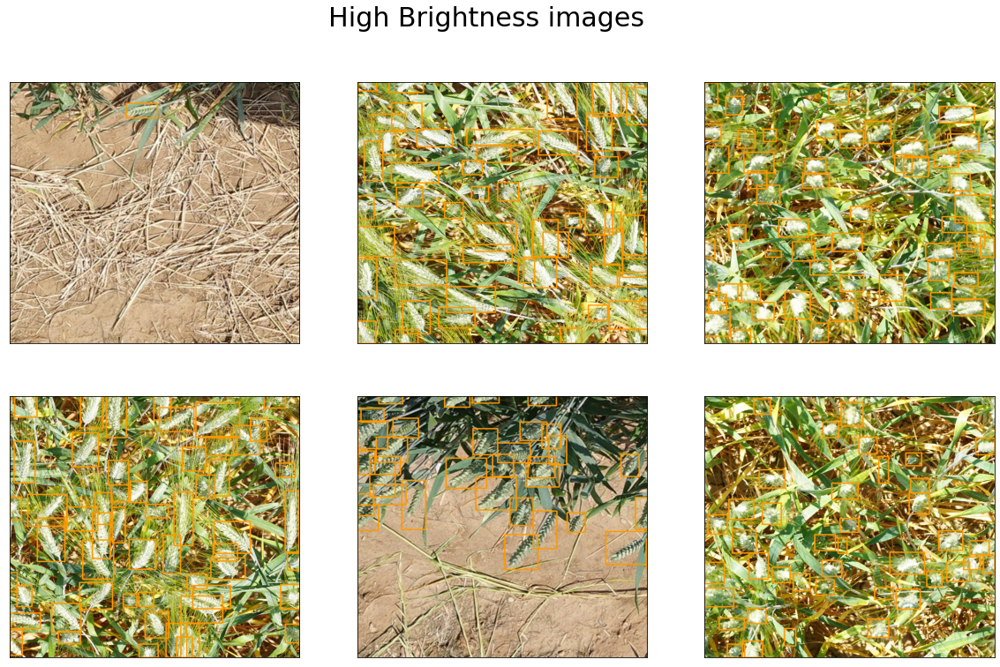

In [31]:
sample= df2.sort_values(by=['brightness'], ascending=False).reset_index()[:6].image_id.values

path= '../input/global-wheat-detection/train'
f, ax= plt.subplots(2, 3, figsize=(20, 12))
i=0
for label in tqdm(sample):
    img_path= os.path.join(path, label)
    img_path= img_path + '.jpg'
    
    img= load(img_path)
    img= draw_rec(img, df2.sort_values(by=['brightness'], ascending=False).reset_index()[:6].boxes[i])
    ax[i//3][i%3].imshow(img, aspect='auto')
    ax[i//3][i%3].set_xticks([]); ax[i//3][i%3].set_yticks([])
    i+=1
plt.suptitle("High Brightness images", size=30)
plt.show()

## Dark images

  0%|          | 0/6 [00:00<?, ?it/s]

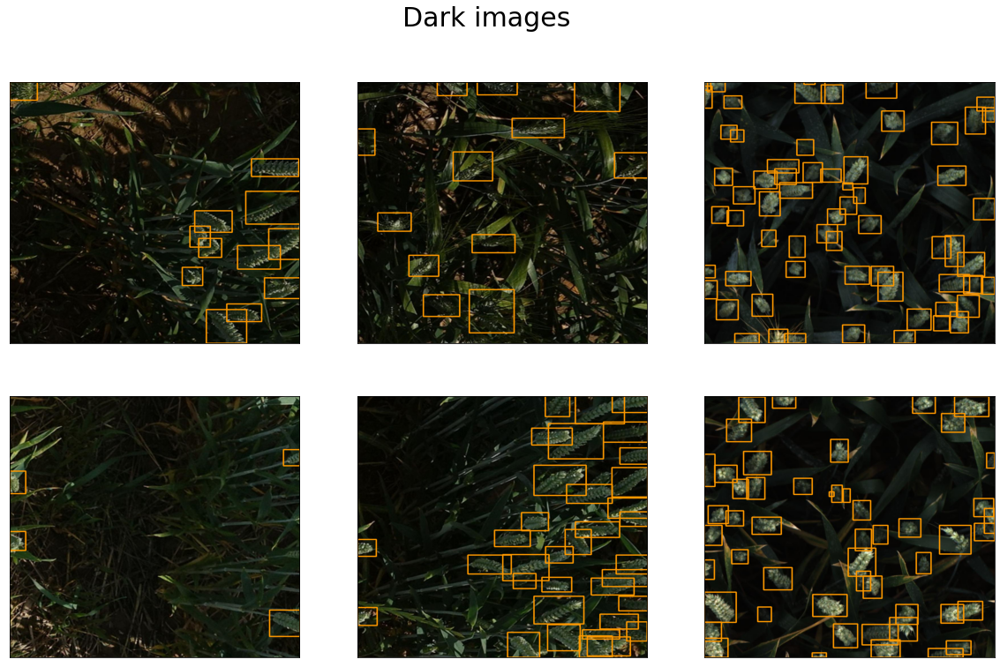

In [32]:
sample= df2.sort_values(by=['brightness'], ascending=True)[10:16].reset_index().image_id.values

path= '../input/global-wheat-detection/train'
f, ax= plt.subplots(2, 3, figsize=(20, 12))
i=0
for label in tqdm(sample):
    img_path= os.path.join(path, label)
    img_path= img_path + '.jpg'
    
    img= load(img_path)
    img= draw_rec(img, df2.sort_values(by=['brightness'], ascending=True)[10:16].reset_index().boxes[i])
    ax[i//3][i%3].imshow(img, aspect='auto')
    ax[i//3][i%3].set_xticks([]); ax[i//3][i%3].set_yticks([])
    i+=1
plt.suptitle("Dark images", size=30)
plt.show()